In [1]:
%load_ext autoreload
%autoreload 2
# imports
import logging
import sys, os
import time
from tf_pose import common
import cv2
import numpy as np
from tf_pose.estimator import TfPoseEstimator
from tf_pose.networks import get_graph_path, model_wh
from tf_pose.common import CocoPart
import matplotlib.pyplot as plt
import asyncio
import datetime
import random
import glob
from tqdm import tqdm


import tensorflow as tf
sys.path.insert(0, os.path.abspath('..'))
# Import DeepExplain
from deepexplain.tf.v1_x import DeepExplain

logger = logging.getLogger('TfPoseEstimatorRun')
logger.handlers.clear()
logger.setLevel(logging.ERROR)
ch = logging.StreamHandler()
ch.setLevel(logging.ERROR)
formatter = logging.Formatter('[%(asctime)s] [%(name)s] [%(levelname)s] %(message)s')
ch.setFormatter(formatter)
logger.addHandler(ch)


The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.


Using tf version = 1.15.0


In [2]:
# params 432, 368
w, h = 432, 368
model = 'cmu'
resize_out_ratio = 2.0
e = TfPoseEstimator(get_graph_path(model), target_size=(w, h), trt_bool=False)
image_path = './data/images/*.jpg'
test_data = [f for f in glob.glob(image_path)]
# image = common.read_imgfile(image_path, w, h)
attribution_part = CocoPart.RShoulder.value


[2020-01-03 18:51:15,223] [TfPoseEstimator] [INFO] loading graph from /home/ax/Programs/tf-pose-estimation/models/graph/cmu/graph_opt.pb(default size=432x368)
2020-01-03 18:51:15,223 INFO loading graph from /home/ax/Programs/tf-pose-estimation/models/graph/cmu/graph_opt.pb(default size=432x368)


2020-01-03 18:51:15,225 WARNING From /home/ax/Programs/tf-pose-estimation/tf_pose/estimator.py:311: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.



2020-01-03 18:51:15,225 WARNING From /home/ax/Programs/tf-pose-estimation/tf_pose/estimator.py:312: The name tf.GraphDef is deprecated. Please use tf.compat.v1.GraphDef instead.



2020-01-03 18:51:15,582 WARNING From /home/ax/Programs/tf-pose-estimation/tf_pose/estimator.py:330: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.



2020-01-03 18:51:16,011 WARNING From /home/ax/Programs/tf-pose-estimation/tf_pose/estimator.py:332: The name tf.Session is deprecated. Please use tf.compat.v1.Session instead.



2020-01-03 18:51:16,201 WARNING From /home/ax/Programs/tf-pose-estimation/tf_pose/estimator.py:339: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.



2020-01-03 18:51:16,202 WARNING From /home/ax/Programs/tf-pose-estimation/tf_pose/estimator.py:340: The name tf.image.resize_area is deprecated. Please use tf.compat.v1.image.resize_area instead.



2020-01-03 18:51:16,209 WARNING From /home/ax/Programs/tf-pose-estimation/tf_pose/tensblur/smoother.py:96: The name tf.variable_scope is deprecated. Please use tf.compat.v1.variable_scope instead.



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


2020-01-03 18:51:16,222 WARNING From /home/ax/Programs/tf-pose-estimation/tf_pose/estimator.py:352: where (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


2020-01-03 18:51:16,225 WARNING From /home/ax/Programs/tf-pose-estimation/tf_pose/estimator.py:357: The name tf.variables_initializer is deprecated. Please use tf.compat.v1.variables_initializer instead.



2020-01-03 18:51:16,226 WARNING From /home/ax/Programs/tf-pose-estimation/tf_pose/estimator.py:358: The name tf.global_variables is deprecated. Please use tf.compat.v1.global_variables instead.



2020-01-03 18:51:16,226 WARNING From /home/ax/Programs/tf-pose-estimation/tf_pose/estimator.py:360: The name tf.report_uninitialized_variables is deprecated. Please use tf.compat.v1.report_uninitialized_variables instead.



In [3]:
results = []
LIM = 15

for image_path in tqdm(test_data):
    current_stats = {}
    # read file
    current_stats["image"] = common.read_imgfile(image_path, w, h)
    # compute humans and draw them onto the image
    humans = e.inference(current_stats["image"], resize_to_default=(w > 0 and h > 0), upsample_size=resize_out_ratio)
    current_stats["image_result"] = TfPoseEstimator.draw_humans(current_stats["image"], humans, imgcopy=True)
    # get the resulting confidence map
    current_stats["heatmap"] = e.heatMat[:, :, attribution_part]
    # get the current session
    sess = e.persistent_sess

    # Since we will explain it, the model has to be wrapped in a DeepExplain context
    with DeepExplain(session=sess, graph=e.graph) as de:
        
        input_tensor = e.tensor_image
        output_tensor = e.tensor_heatMat[:, :, :, attribution_part]
        xs = tf.expand_dims(current_stats["image"], 0).eval(session=sess)
        xs = xs.astype('float64')
       
        Y_shape=[None] + [1, 46, 54] # size of heatmaps
        
        baseline = np.zeros(list(xs.shape)[1:]) # baseline to compare against
        current_stats['Saliency maps'] = de.explain('saliency', T=output_tensor, X=input_tensor, xs=xs, Y_shape=Y_shape)
        current_stats['Gradient * Input'] = de.explain('grad*input', T=output_tensor, X=input_tensor, xs=xs, Y_shape=Y_shape)
        # current_stats['Integrated Gradients'] = de.explain('intgrad',  T=output_tensor, X=input_tensor, xs=xs, Y_shape=Y_shape, baseline=baseline)
    
    results.append(current_stats)
    if len(results) == LIM:
        break

  0%|          | 0/21 [00:00<?, ?it/s]2020-01-03 18:51:23,674 INFO DeepExplain: running "saliency" explanation method (1)
2020-01-03 18:51:23,677 INFO Model with multiple inputs: False
/home/ax/master/2019_02/masterThesis/DeepExplain/deepexplain/tf/v1_x/main.py:95: UserWarning: DeepExplain detected you are trying to use an attribution method that requires gradient override but the original gradient was used instead. You might have forgot to (re)create your graph within the DeepExlain context. Results are not reliable!
  warnings.warn('DeepExplain detected you are trying to use an attribution method that requires '
2020-01-03 18:51:28,947 INFO DeepExplain: running "grad*input" explanation method (2)
2020-01-03 18:51:28,951 INFO Model with multiple inputs: False
  5%|▍         | 1/21 [00:12<04:02, 12.14s/it]2020-01-03 18:51:35,902 INFO DeepExplain: running "saliency" explanation method (1)
2020-01-03 18:51:35,908 INFO Model with multiple inputs: False
2020-01-03 18:51:41,404 INFO DeepExp

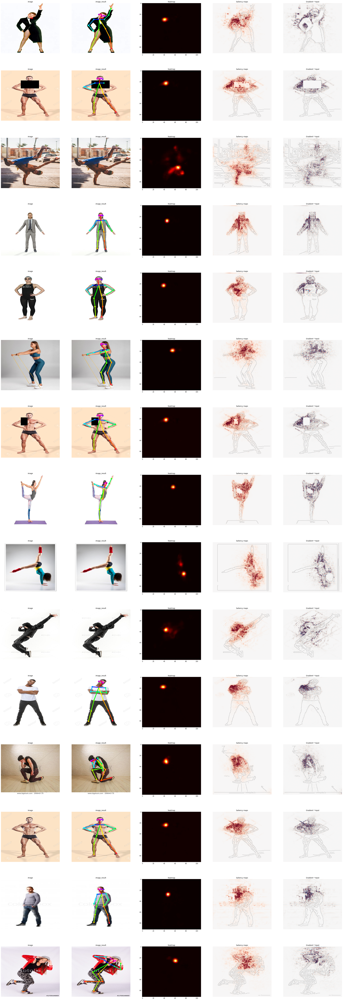

In [6]:
# Plot attributions
from utils import plot, plt
%matplotlib inline

n_cols = int(len(results[0])) 
n_rows = int(len(results)) 
fig_scale = 3
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(3*n_cols*fig_scale, 3*n_rows*fig_scale))

for i, result in enumerate(results):
    ax = axes.flatten()[i*n_cols]
    ax.imshow(result['image'])
    ax.set_title('Original')
    ax.axis('off')
    for j, (key, value) in enumerate(result.items()):
        axj = axes.flatten()[i*n_cols + j]
        if key == 'image' or key == 'image_result':
            axj.imshow(cv2.cvtColor(value, cv2.COLOR_BGR2RGB))
            axj.set_title(key)
            axj.axis('off')
        elif key == 'heatmap':
            axj.imshow(value, cmap=plt.cm.hot, alpha=1.0)
            axj.set_title(key)
            # _ = plt.colorbar()
        elif key == 'humans':
            continue
        else:
            xi = (result['image'] - np.min(result['image'])).astype('float64')
            xi /= np.max(xi)
            plot(value[0], xi = xi, axis=axj, dilation=.5, percentile=99, alpha=.2).set_title(key)